# Examen 1
1. Reproducir el análisis de PCA aplicado al Iris dataset, utilizando 3 componentes
    1. Indicar el porcentaje de la información utilizando los 3 componentes principales
    1. Hacer el scatter 3D de los datos proyectados, con cualquiera de los 3 métodos
1. Realizar el análisis de PCA utilizando el dataset Brain_tumor, archivo Brain tumor.csv
    1. ¿Qué notan de extraño con la columna "Coarseness" al normalizar el dataset?
    1. Determinar el porcentaje de aporte de cada vector propio
    1. Determinar cuántos componentes principales son necesarios para obtener al menos un 90% de datos
    1. Realizar la proyección de la data original al espacio reducido mediante 2 métodos y comparar resultados
    1. Hacer la comparsión de los pairplot con la data original y la data proyectada
    "Nota: En el dataset Iris, la variable \"Species\" era descartada; en el dataset Brain_tumor, descartar la variable 'Class'"

In [14]:
import os
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
# Colores personalizados
palette = sns.color_palette("Set2")

# Iris dataset

In [12]:
path = r"C:\Users\daphn\Documents\UNAM\Neurociencias\Sexto Semestre\Modelos computacionales II\Neurociencias-2025-2\S03_datasets\iris\iris.csv"
df_iris = pd.read_csv(path)
df.head(2)
X_iris = df_iris.iloc[:, :-1]  # Excluir la columna 'Species'
y_iris = df_iris["Species"]  # Guardar etiquetas de clase

In [4]:
X = df.iloc[:, :4] # Definición del dataset

# Normalización del dataframe
media, sigma = X.mean(axis=0), X.std(axis=0)
X_std = (X - media)/sigma
X_std

,Sepal.Length,Sepal.Width,Petal.Length,Petal.Width
0,-0.897674,1.015602,-1.335752,-1.311052
1,-1.139200,-0.131539,-1.335752,-1.311052
2,-1.380727,0.327318,-1.392399,-1.311052
3,-1.501490,0.097889,-1.279104,-1.311052
4,-1.018437,1.245030,-1.335752,-1.311052
...,...,...,...,...
145,1.034539,-0.131539,0.816859,1.443994
146,0.551486,-1.278680,0.703564,0.919223
147,0.793012,-0.131539,0.816859,1.050416
148,0.430722,0.786174,0.930154,1.443994


In [5]:
# Cálculo de la matriz de covarianza
cov_matrix = (X_std - X_std.mean(axis=0)).T.dot((X_std - X_std.mean(axis=0)))/(X_std.shape[0]-1)
cov_matrix

,Sepal.Length,Sepal.Width,Petal.Length,Petal.Width
Sepal.Length,1.000000,-0.117570,0.871754,0.817941
Sepal.Width,-0.117570,1.000000,-0.428440,-0.366126
Petal.Length,0.871754,-0.428440,1.000000,0.962865
Petal.Width,0.817941,-0.366126,0.962865,1.000000


In [6]:
np.cov(X_std.T)

array([[ 1.        , -0.11756978,  0.87175378,  0.81794113],
       [-0.11756978,  1.        , -0.4284401 , -0.36612593],
       [ 0.87175378, -0.4284401 ,  1.        ,  0.96286543],
       [ 0.81794113, -0.36612593,  0.96286543,  1.        ]])

In [7]:
# Cálculo de valores y vectores propios
eig_vals, eig_vectors = np.linalg.eig(cov_matrix)
eig_vals, eig_vectors = np.linalg.eig(np.cov(X_std.T))
print("Valores propios \n%s"%eig_vals)
print("Vectores propios \n%s"%eig_vectors)

Valores propios 
[2.91849782 0.91403047 0.14675688 0.02071484]
Vectores propios 
[[ 0.52106591 -0.37741762 -0.71956635  0.26128628]
 [-0.26934744 -0.92329566  0.24438178 -0.12350962]
 [ 0.5804131  -0.02449161  0.14212637 -0.80144925]
 [ 0.56485654 -0.06694199  0.63427274  0.52359713]]


In [8]:
# Porcentajes de valores y vectores propios
eigen_pairs = [(np.abs(eig_vals[i]), eig_vectors[:,i]) for i in range(len(eig_vals))]
# Ordenamos de mayor a menor
eigen_pairs.sort(reverse=True)

# Calculamos los porcentajes
total_sum = sum(eig_vals)
var_exp = [(i/total_sum)*100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

print('Porcentaje de información de 4 componentes:')
var_exp

Porcentaje de información de 4 componentes:


[np.float64(72.96244541329987),
 np.float64(22.85076178670175),
 np.float64(3.6689218892828896),
 np.float64(0.5178709107154735)]

In [9]:
# Ahora con tres componentes
pca = PCA(n_components=3)
data_proyectada = pca.fit_transform(X_std)

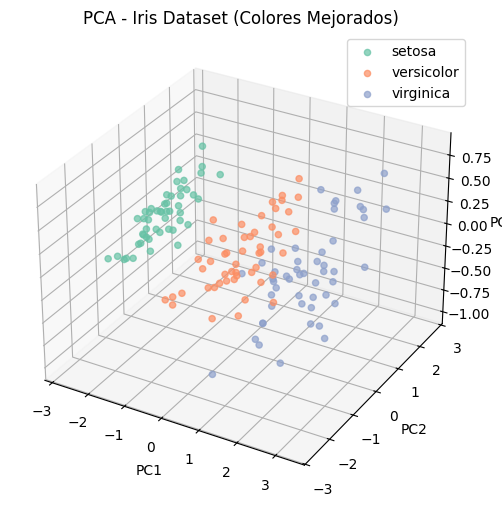

In [16]:
# Gráfico 3D con colores personalizados
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')
species_unique = y_iris.unique()
colors = dict(zip(species_unique, palette))
for species in species_unique:
    indices = y_iris == species
    ax.scatter(data_proyectada[indices, 0], data_proyectada[indices, 1], data_proyectada[indices, 2],
               label=species, color=colors[species], alpha=0.7)
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
plt.title("PCA - Iris Dataset (Colores Mejorados)")
plt.legend()
plt.show()

# Brain tumor dataset

In [17]:
path = r"C:\Users\daphn\Documents\UNAM\Neurociencias\Sexto Semestre\Modelos computacionales II\Neurociencias-2025-2\S03_datasets\Brain_tumor\Brain Tumor.csv"
df = pd.read_csv(path)
df.head(2)

,Image,Class,Mean,Variance,Standard Deviation,Entropy,Skewness,Kurtosis,Contrast,Energy,ASM,Homogeneity,Dissimilarity,Correlation,Coarseness
0,Image1,0,6.535339,619.587845,24.891522,0.109059,4.276477,18.900575,98.613971,0.293314,0.086033,0.530941,4.473346,0.981939,7.458341e-155
1,Image2,0,8.749969,805.957634,28.389393,0.266538,3.718116,14.464618,63.858816,0.475051,0.225674,0.651352,3.220072,0.988834,7.458341e-155


<Figure size 500x500 with 0 Axes>

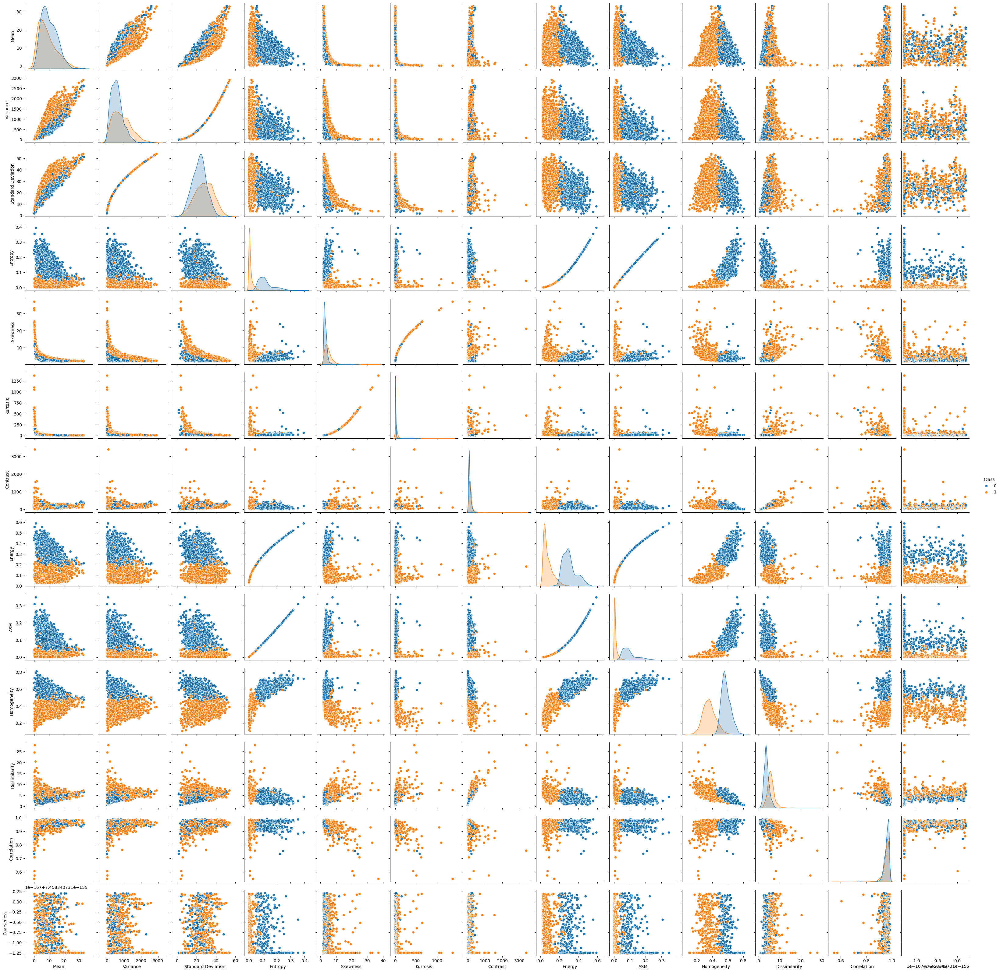

In [18]:
plt.figure(figsize=(5, 5))
sns.pairplot(df, hue='Class')

In [40]:
print(df.columns)

Index(['Image', 'Class', 'Mean', 'Variance', 'Standard Deviation', 'Entropy',
       'Skewness', 'Kurtosis', 'Contrast', 'Energy', 'ASM', 'Homogeneity',
       'Dissimilarity', 'Correlation', 'Coarseness'],
      dtype='object')


In [37]:
#X = df.iloc[:, :12]
# Filtrar solo columnas numéricas
#X = X.select_dtypes(include=[np.number])

#Normalizamos dataset
media, sigma = X.mean(axis=0), X.std(axis=0)
X_std = (X - media)/sigma

In [38]:
print(X.shape)

(3762, 11)


In [39]:
print(X.columns)

Index(['Class', 'Mean', 'Variance', 'Standard Deviation', 'Entropy',
       'Skewness', 'Kurtosis', 'Contrast', 'Energy', 'ASM', 'Homogeneity'],
      dtype='object')


La columna "Coarseness" tiene un valor constante por lo que su desviación estandar es cero y al normalizar la información todos los valores de esa columna se volvieron 0 o NaN y por eso el tipo de información aparece como "objeto" :)

In [43]:
# Matriz de covarianza
cov_matrix = (X_std - X_std.mean(axis=0)).T.dot((X_std - X_std.mean(axis=0)))/(X_std.shape[0]-1)
np.cov(X_std.T)

array([[ 1.        , -0.09572911,  0.30881826,  0.28556842, -0.77818023,
         0.40264416,  0.23984422,  0.21264331, -0.86241293, -0.75825486,
        -0.84752862],
       [-0.09572911,  1.        ,  0.78302707,  0.79098428, -0.09972894,
        -0.60159344, -0.3581634 , -0.05097359, -0.0148629 , -0.10939257,
         0.09555571],
       [ 0.30881826,  0.78302707,  1.        ,  0.97569853, -0.3444318 ,
        -0.34739893, -0.24831178,  0.1354942 , -0.33546967, -0.34106084,
        -0.29052673],
       [ 0.28556842,  0.79098428,  0.97569853,  1.        , -0.34512702,
        -0.42542807, -0.32979784,  0.11798145, -0.33110268, -0.34252995,
        -0.28880149],
       [-0.77818023, -0.09972894, -0.3444318 , -0.34512702,  1.        ,
        -0.22222237, -0.14012485, -0.14076918,  0.97126042,  0.99921258,
         0.85201917],
       [ 0.40264416, -0.60159344, -0.34739893, -0.42542807, -0.22222237,
         1.        ,  0.89971337,  0.34985617, -0.29541263, -0.20928868,
        -0.470

In [44]:
# Valores y vectores propios
eig_vals, eig_vectors = np.linalg.eig(cov_matrix)
eig_vals, eig_vectors = np.linalg.eig(np.cov(X_std.T))
print("Valores propios \n%s"%eig_vals)
print("Vectores propios \n%s"%eig_vectors)

Valores propios 
[5.05941655e+00 3.35784192e+00 1.24943759e+00 6.51785156e-01
 3.83428767e-01 1.48975312e-01 8.89183085e-02 3.28379635e-02
 1.60224077e-02 1.12810720e-02 5.49476063e-05]
Vectores propios 
[[-3.93487498e-01  7.76111379e-02  6.36029527e-02  4.96249108e-02
   5.45046527e-01 -7.09624846e-01 -6.40404366e-02 -6.38013292e-02
   1.12594722e-01 -1.05244774e-01  8.19597152e-03]
 [-4.97636823e-02 -4.77587865e-01 -2.13429673e-01 -2.95668351e-01
  -3.99749135e-01 -3.51352051e-01 -5.44592081e-01  2.16504932e-01
   2.77802876e-02  9.45961109e-02  6.21972581e-03]
 [-2.08372996e-01 -4.23090280e-01 -2.97577997e-01 -1.81684159e-01
   2.53100371e-01  1.52641799e-01  3.52961730e-01  3.08404333e-01
  -4.41866116e-01 -3.91977273e-01 -8.19344246e-03]
 [-2.01727184e-01 -4.45787453e-01 -2.47387510e-01 -1.01342986e-01
   2.36623057e-01  2.50233277e-01  1.87549440e-01 -3.38523584e-01
   5.08743626e-01  4.02315978e-01  7.09309915e-03]
 [ 4.20528880e-01  6.58040456e-03 -1.99931520e-01 -4.60910998e-0

In [53]:
# Porcentaje de cada vector propio
eigen_pairs = [(np.abs(eig_vals[i]), eig_vectors[:,i]) for i in range(len(eig_vals))]

# Ordenamos de mayor a menor
eigen_pairs.sort(reverse=True)

eigen_pairs

[(np.float64(5.059416551002554),
  array([-0.3934875 , -0.04976368, -0.208373  , -0.20172718,  0.42052888,
         -0.15178019, -0.11041741, -0.12432616,  0.43018874,  0.41622578,
          0.4156212 ])),
 (np.float64(3.3578419247841746),
  array([ 0.07761114, -0.47758787, -0.42309028, -0.44578745,  0.0065804 ,
          0.46338104,  0.39067705,  0.10042741, -0.02628287,  0.01073477,
         -0.09934272])),
 (np.float64(1.249437589200427),
  array([ 0.06360295, -0.21342967, -0.297578  , -0.24738751, -0.19993152,
         -0.27226833, -0.39465154, -0.67059045, -0.19824389, -0.20234366,
         -0.0293523 ])),
 (np.float64(0.6517851563103342),
  array([ 0.04962491, -0.29566835, -0.18168416, -0.10134299, -0.0460911 ,
         -0.26419989, -0.55841996,  0.69146821, -0.0280891 , -0.04930035,
         -0.04161036])),
 (np.float64(0.3834287671281749),
  array([ 0.54504653, -0.39974913,  0.25310037,  0.23662306,  0.3578958 ,
          0.11784239, -0.2058724 , -0.18620419,  0.06066798,  0.40

In [54]:
# Aplicar PCA completo
pca = PCA()
X = pca.fit_transform(X_std)

# Porcentaje de varianza explicada
var_exp = np.cumsum(pca.explained_variance_ratio_ * 100)
num_components = np.argmax(var_exp >= 90) + 1
print(f"Número de componentes necesarios para explicar al menos el 90% de la varianza: {num_components}")

Número de componentes necesarios para explicar al menos el 90% de la varianza: 4


In [51]:
var_exp

array([ 45.99469592,  76.5205316 ,  87.87905514,  93.80437474,
        97.2900908 ,  98.64441182,  99.45276008,  99.75128702,
        99.89694528,  99.99950048, 100.        ])

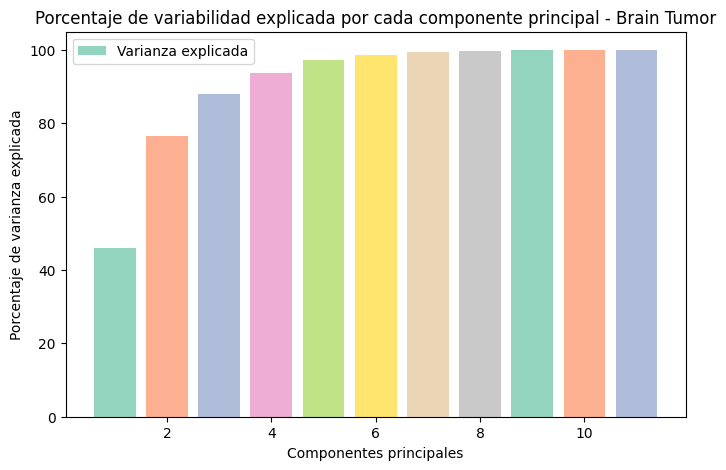

In [82]:
# Gráfico de barras de varianza explicada
plt.figure(figsize=(8,5))
plt.bar(range(1, len(var_exp)+1), var_exp, color=palette, alpha=0.7, align='center', label='Varianza explicada')

plt.xlabel('Componentes principales')
plt.ylabel('Porcentaje de varianza explicada')
plt.title('Porcentaje de variabilidad explicada por cada componente principal - Brain Tumor')
plt.legend()
plt.show()

In [56]:
# Matriz que representa la transformación lineal
eigen_pairs

[(np.float64(5.059416551002554),
  array([-0.3934875 , -0.04976368, -0.208373  , -0.20172718,  0.42052888,
         -0.15178019, -0.11041741, -0.12432616,  0.43018874,  0.41622578,
          0.4156212 ])),
 (np.float64(3.3578419247841746),
  array([ 0.07761114, -0.47758787, -0.42309028, -0.44578745,  0.0065804 ,
          0.46338104,  0.39067705,  0.10042741, -0.02628287,  0.01073477,
         -0.09934272])),
 (np.float64(1.249437589200427),
  array([ 0.06360295, -0.21342967, -0.297578  , -0.24738751, -0.19993152,
         -0.27226833, -0.39465154, -0.67059045, -0.19824389, -0.20234366,
         -0.0293523 ])),
 (np.float64(0.6517851563103342),
  array([ 0.04962491, -0.29566835, -0.18168416, -0.10134299, -0.0460911 ,
         -0.26419989, -0.55841996,  0.69146821, -0.0280891 , -0.04930035,
         -0.04161036])),
 (np.float64(0.3834287671281749),
  array([ 0.54504653, -0.39974913,  0.25310037,  0.23662306,  0.3578958 ,
          0.11784239, -0.2058724 , -0.18620419,  0.06066798,  0.40

In [57]:
eigen_pairs[0][1], eigen_pairs[1][1], eigen_pairs[2][1], eigen_pairs[3][1]

(array([-0.3934875 , -0.04976368, -0.208373  , -0.20172718,  0.42052888,
        -0.15178019, -0.11041741, -0.12432616,  0.43018874,  0.41622578,
         0.4156212 ]),
 array([ 0.07761114, -0.47758787, -0.42309028, -0.44578745,  0.0065804 ,
         0.46338104,  0.39067705,  0.10042741, -0.02628287,  0.01073477,
        -0.09934272]),
 array([ 0.06360295, -0.21342967, -0.297578  , -0.24738751, -0.19993152,
        -0.27226833, -0.39465154, -0.67059045, -0.19824389, -0.20234366,
        -0.0293523 ]),
 array([ 0.04962491, -0.29566835, -0.18168416, -0.10134299, -0.0460911 ,
        -0.26419989, -0.55841996,  0.69146821, -0.0280891 , -0.04930035,
        -0.04161036]))

In [58]:
T_matrix = np.stack((eigen_pairs[0][1], eigen_pairs[1][1], eigen_pairs[2][1], eigen_pairs[3][1]), axis=1)
T_matrix

array([[-0.3934875 ,  0.07761114,  0.06360295,  0.04962491],
       [-0.04976368, -0.47758787, -0.21342967, -0.29566835],
       [-0.208373  , -0.42309028, -0.297578  , -0.18168416],
       [-0.20172718, -0.44578745, -0.24738751, -0.10134299],
       [ 0.42052888,  0.0065804 , -0.19993152, -0.0460911 ],
       [-0.15178019,  0.46338104, -0.27226833, -0.26419989],
       [-0.11041741,  0.39067705, -0.39465154, -0.55841996],
       [-0.12432616,  0.10042741, -0.67059045,  0.69146821],
       [ 0.43018874, -0.02628287, -0.19824389, -0.0280891 ],
       [ 0.41622578,  0.01073477, -0.20234366, -0.04930035],
       [ 0.4156212 , -0.09934272, -0.0293523 , -0.04161036]])

In [59]:
T_matrix.shape

(11, 4)

In [60]:
# Método de proyección de datos 1
espacio_proyectado = []

for idx in range(len(X_std)):
    vec = X_std.iloc[idx, :] # vector en R4
    Tvec = T_matrix.T.dot(vec) # proyección del espacio de 4D a 2D
    espacio_proyectado.append(Tvec)

espacio_proyectado_np = np.array(espacio_proyectado)
espacio_proyectado_np.shape

(3762, 4)

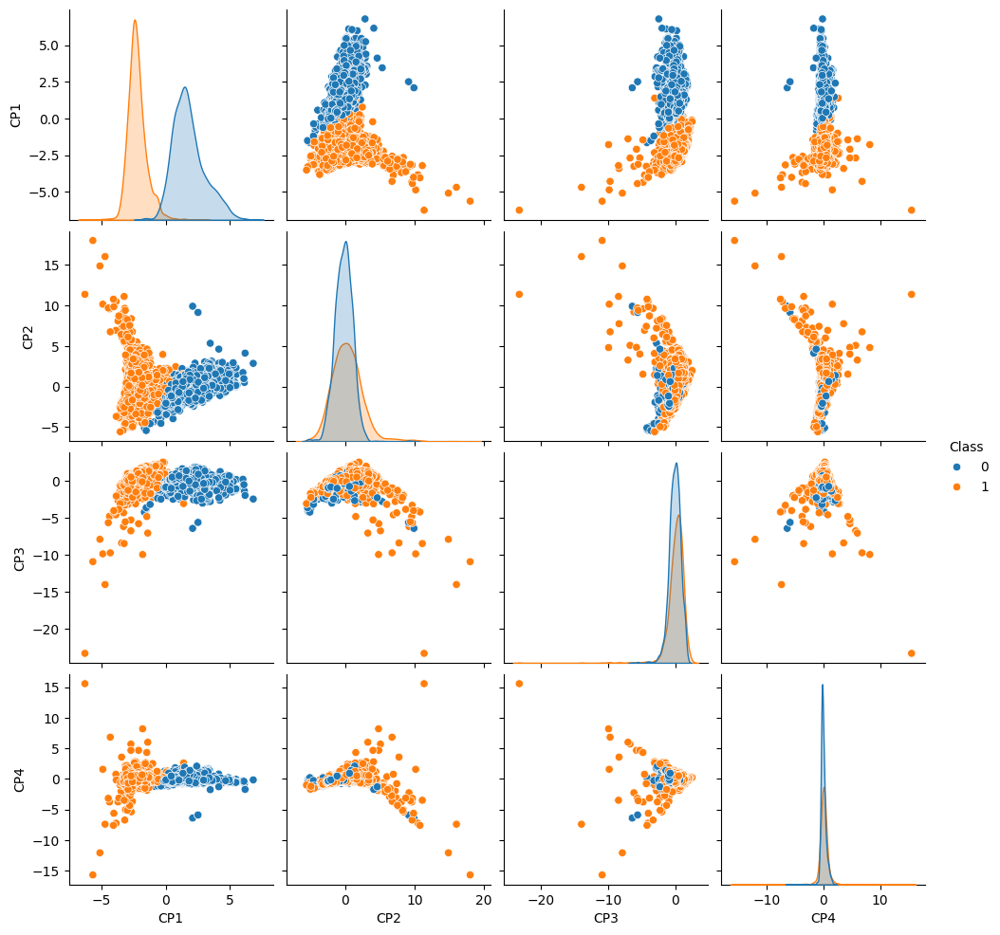

In [85]:
# Método 1
df_proyectado = pd.DataFrame({'CP1': espacio_proyectado_np[:, 0], 
                              'CP2': espacio_proyectado_np[:, 1],
                              'CP3': espacio_proyectado_np[:, 2],
                              'CP4': espacio_proyectado_np[:, 3],
                              'Class': df['Class']})
#sns.scatterplot(data=df_proyectado, x='CP1', y='CP2', hue='Class')

#sns.scatterplot(pd.DataFrame(X, columns=["CP1", "CP2", "CP3","CP4"]))
#plt.suptitle("Pairplot de datos proyectados en 2D")

sns.pairplot(df_proyectado, hue="Class")

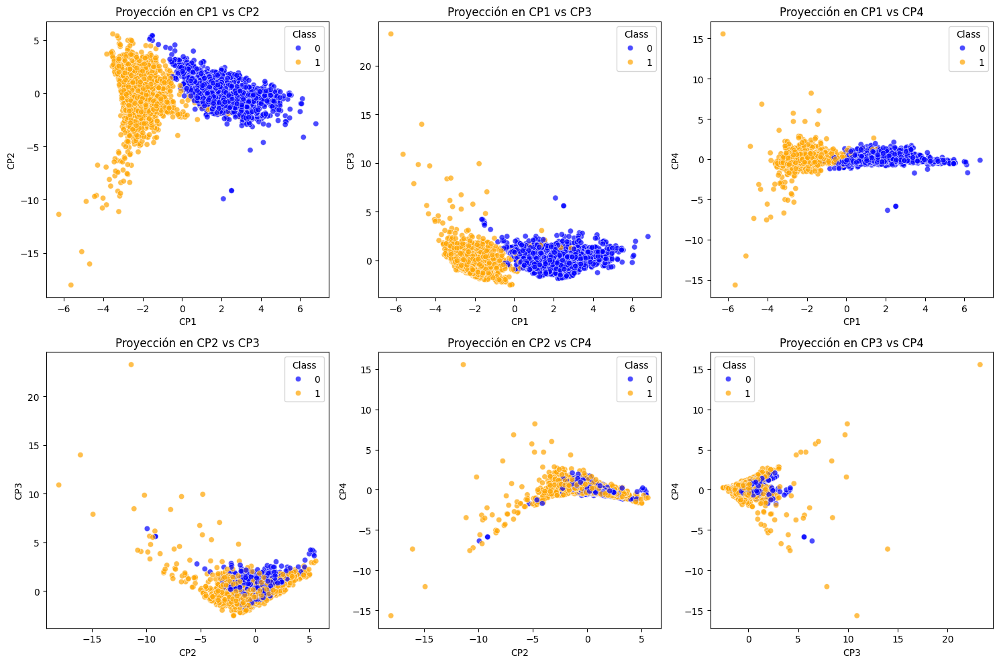

In [94]:
# Método 2 para proyección de datos
pca = PCA(n_components=4)
data_proyectada = pca.fit_transform(X_std)

# Crear DataFrame con proyección y clase
df_proyectado_brain = pd.DataFrame({'CP1': X[:, 0],
                                    'CP2': X[:, 1],
                                    'CP3': X[:, 2],
                                    'CP4': X[:, 3],
                                    'Class': y})

# Generar scatter plot con 4 componentes (proyectado en pares)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
pairs = [("CP1", "CP2"), ("CP1", "CP3"), ("CP1", "CP4"), ("CP2", "CP3"), ("CP2", "CP4"), ("CP3", "CP4")]
for ax, (comp_x, comp_y) in zip(axes.flatten(), pairs):
    sns.scatterplot(data=df_proyectado_brain, x=comp_x, y=comp_y, hue="Class", palette=["blue", "orange"], alpha=0.7, ax=ax)
    ax.set_xlabel(comp_x)
    ax.set_ylabel(comp_y)
    ax.set_title(f"Proyección en {comp_x} vs {comp_y}")

plt.tight_layout()
plt.show()


# Comparación de scatter plots: Original vs Proyectado

<Figure size 500x500 with 0 Axes>

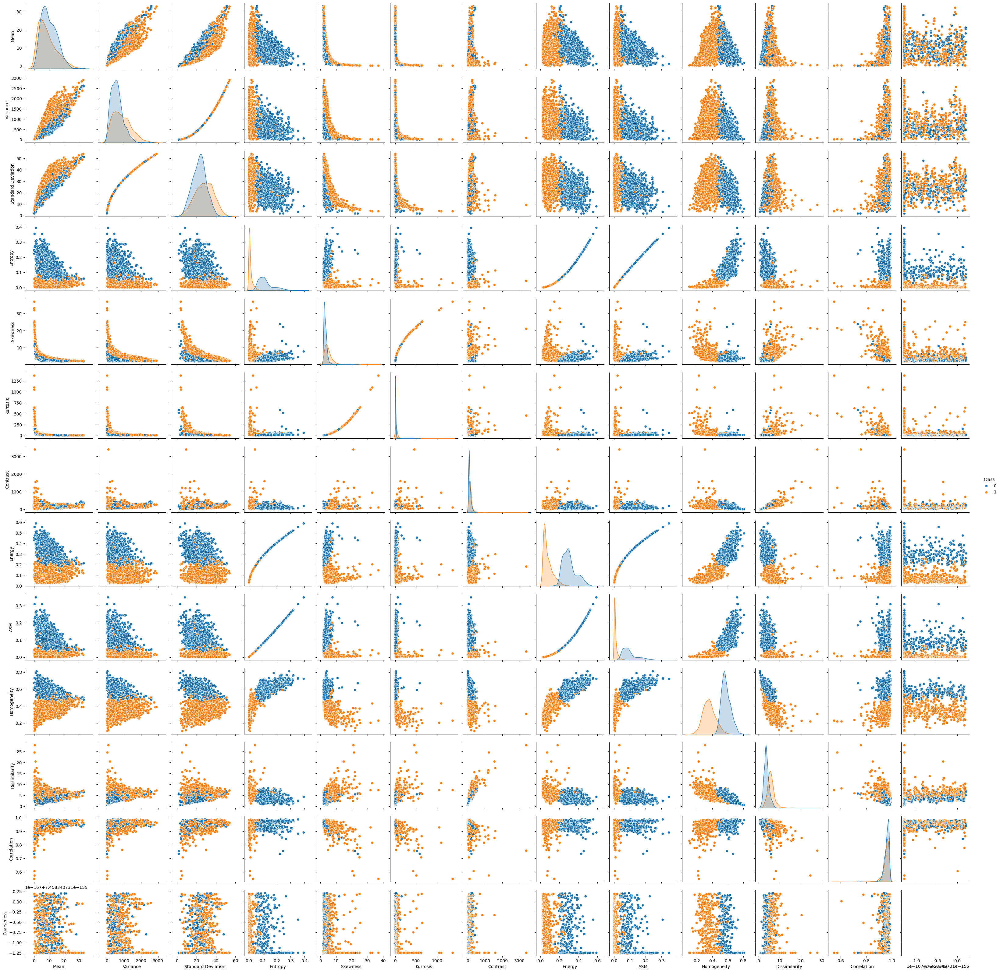

In [88]:
plt.figure(figsize=(5, 5))
sns.pairplot(df, hue='Class')

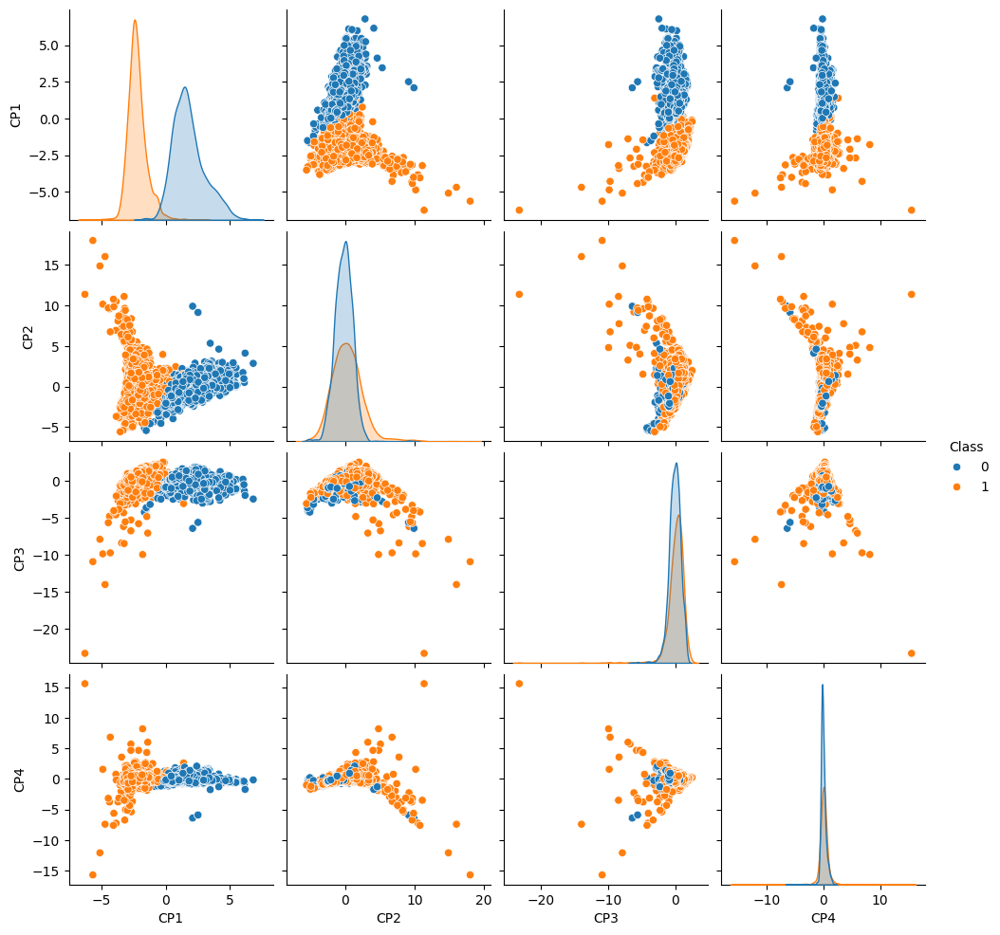

In [89]:
sns.pairplot(df_proyectado, hue="Class")